# RAPIDS & Scanpy Single-Cell RNA-seq Workflow on mouse thalamus cells

Copyright (c) 2020, NVIDIA CORPORATION.

Licensed under the Apache License, Version 2.0 (the "License") you may not use this file except in compliance with the License. You may obtain a copy of the License at

    http://www.apache.org/licenses/LICENSE-2.0 

Unless required by applicable law or agreed to in writing, software distributed under the License is distributed on an "AS IS" BASIS, WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied. See the License for the specific language governing permissions and limitations under the License.

This notebook demonstrates a single-cell RNA analysis workflow that begins with preprocessing a count matrix of size `(n_gene, n_cell)` and results in a visualization of the clustered cells for further analysis.

For demonstration purposes, we use a dataset of 1.3 M brain cells with Unified Virtual Memory to oversubscribe GPU memory.

## Import requirements

In [1]:
import numpy as np
import scanpy as sc
import anndata

import time
import os, wget

import cupy as cp
import cudf

from cuml.decomposition import PCA
from cuml.manifold import TSNE
from cuml.cluster import KMeans
from cuml.preprocessing import StandardScaler

import rapids_scanpy_funcs
import utils

import warnings
warnings.filterwarnings('ignore', 'Expected ')
warnings.simplefilter('ignore')
import pandas as pd
from sh import gunzip
import scipy

We use the RAPIDS memory manager to enable Unified Virtual Memory management, which allows us to oversubscribe the GPU memory.

In [2]:
import rmm

rmm.reinitialize(managed_memory=True)
cp.cuda.set_allocator(rmm.rmm_cupy_allocator)

## Input data

In the cell below, we provide the path to the sparse `.h5ad` file containing the count matrix to analyze. Please see the README for instructions on how to download the dataset we use here.

To run this notebook using your own dataset, please see the README for instructions to convert your own count matrix into this format. Then, replace the path in the cell below with the path to your generated `.h5ad` file.

In [3]:
def download_file(url,dir,download_file):
    ext=download_file.split(".")[-1]
    if ext=="gz":
        is_gz=True   
    if is_gz:
        input_file=os.path.join(dir,download_file.replace(".gz",""))
    else:
        input_file=download_file

    if not os.path.exists(os.path.join(dir,input_file)):
        print('Downloading %s'%download_file)
        os.makedirs(dir, exist_ok=True)
        wget.download(url,os.path.join(dir,download_file))

In [3]:
url_list=[r"https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE116470&format=file&file=GSE116470%5FF%5FGRCm38%2E81%2EP60Thalamus%2Eraw%2Edge%2Etxt%2Egz"]

dir="/temp/data/mouse_thalamus/"
file_list=["GSE116470_F_GRCm38.81.P60Thalamus.raw.dge.txt.gz"]


In [5]:

for idx,url in enumerate(url_list):
    download_file(url,dir,file_list[idx])

In [6]:
for file in file_list:
    gunzip(os.path.join(dir,file))


In [3]:
import numpy as np
from scipy.sparse import coo_matrix
from scipy.sparse import csr_matrix


import scanpy as sc

def load_custom_txt_to_anndata(file_path):
    genes = []
    cells = []
    rows = []
    cols = []
    data = []
    total_genes = 0
    total_cells = 0
    total_reads = 0
    with open(file_path, 'r') as f:
        lines = f.readlines()
        
        parsing_state = None  # 'GENES', 'CELL_BARCODES', or 'data'

        for line in lines:
            line = line.strip()
            
            if line.startswith("%%MatrixMarket"):
                continue
            elif line.startswith("%%GENES"):
                parsing_state = 'GENES'
            elif line.startswith("%%CELL_BARCODES"):
                parsing_state = 'CELL_BARCODES'
            else:
                if parsing_state == 'CELL_BARCODES':
                    parsing_state = None
                else:
                    parsing_state = "data"
            if parsing_state == 'GENES':
                genes += line.replace("%%GENES", "").split()
                #if len(genes) >= total_genes and total_genes > 0:  # Stop collecting when reaching total count
                #    parsing_state = None
            elif parsing_state == 'CELL_BARCODES':
                cells += line.replace("%%CELL_BARCODES", "").split()
                #if len(cells) >= total_cells and total_cells > 0:  # Stop collecting when reaching total count
                #    parsing_state = None
            elif parsing_state is None and len(line.split()) == 3:
                total_genes, total_cells, total_reads = map(int, line.split())
                parsing_state = 'data'
            elif parsing_state == 'data':
                row, col, val = map(int, line.split())
                rows.append(row-1)
                cols.append(col-1)
                data.append(val)
            
    shape = (len(genes), len(cells))
    #matrix = coo_matrix((data, (rows, cols)), shape=shape).T
    matrix = csr_matrix((data, (rows, cols)), shape=shape).T
    
    adata = sc.AnnData(matrix)
    # 疎行列をCSR形式に変換
    #adata.X = csr_matrix(adata.X)
    adata.var_names = genes
    adata.obs_names = cells
    
    print(f"Loaded {len(genes)} genes and {len(cells)} cells.")
    
    return adata

## load data

In [3]:
dir="/temp/data/mouse_thalamus/"
fname=r"GSE116470_F_GRCm38.81.P60Thalamus.raw.dge.txt"

# この関数を使ってファイルを読み込む
file_path = os.path.join(dir,fname)  # ファイルパスを指定してください
#adata = load_custom_txt_to_anndata(file_path)

# AnnDataオブジェクトを確認
#print(adata)

file_path="/temp/data/mouse_thalamus/WT_thalamus_adata.h5ad"
#adata.write(file_path)
adata = anndata.read_h5ad(file_path)

In [20]:
print(adata.obs_names)
print(adata.var_names)

Index(['P60THRep1P1_GTGTCACGATTT', 'P60THRep1P1_GGAGTTAGGTGT',
       'P60THRep1P1_ATTCACAATCCC', 'P60THRep1P1_CACAATAAATTT',
       'P60THRep1P1_GCTTGTAGGAGA', 'P60THRep1P1_GTCTCACTTAGT',
       'P60THRep1P1_TGTATTTGAGTC', 'P60THRep1P1_GTGCTGAGCTGT',
       'P60THRep1P1_TTTAACGGTGTC', 'P60THRep1P1_TTTCGCTTTGGT',
       ...
       'P60THRep6P2_AACTCTATTCGN', 'P60THRep6P2_CACACTGCGTGA',
       'P60THRep6P2_TCTTCCGAAGAA', 'P60THRep6P2_GCTCACCCGGAG',
       'P60THRep6P2_ACAAGTCCTGAA', 'P60THRep6P2_ATATCCCCGGAN',
       'P60THRep6P2_AGTGAACATTGC', 'P60THRep6P2_ACACGAATCGGG',
       'P60THRep6P2_TTACTTTCAAGC', 'P60THRep6P2_GATGGAACGAGA'],
      dtype='object', length=127375)
Index(['0610005C13Rik', '0610007P14Rik', '0610009B22Rik', '0610009E02Rik',
       '0610009L18Rik', '0610009O20Rik', '0610010F05Rik', '0610010K14Rik',
       '0610011F06Rik', '0610012D04Rik',
       ...
       'n-R5s86', 'n-R5s87', 'n-R5s88', 'n-R5s89', 'n-R5s92', 'n-R5s93',
       'n-R5s94', 'n-R5s95', 'n-R5s96', 'n-R5s

## Set parameters

In [4]:
D_R_mtx=pd.read_csv("/temp/drug_receptor_mtx.csv",index_col=0)
GPCR_type_df=pd.read_csv("/temp/GPCR_df.csv",index_col=0)

drug_list=D_R_mtx.index.to_list()
GPCR_list=["HTR1A","HTR1B","HTR1D","HTR1E","HTR2A","HTR2B","HTR2C",
"HTR3A","HTR4","HTR5A","HTR6","HTR7","DRD1","DRD2","DRD3","DRD4","DRD5",
"HRH1","HRH2","HRH3","CHRM1","CHRM2","CHRM3","CHRM4","CHRM5",
"ADRA1A","ADRA1B","ADRA2A","ADRA2B","ADRA2C","ADRB1","ADRB2"]
D_R_mtx.columns=GPCR_list

In [5]:
print(D_R_mtx.index)
print(D_R_mtx.columns)
print(D_R_mtx)

Index(['CHLORPROMAZINE', 'FLUPHENAZINE', 'HALOPERIDOL', 'ZOTEPINE',
       'RISPERIDONE', 'Quetiapine', 'ARIPIPRAZOLE', 'OLANZAPINE', 'CLOZAPINE'],
      dtype='object', name='Ligand')
Index(['HTR1A', 'HTR1B', 'HTR1D', 'HTR1E', 'HTR2A', 'HTR2B', 'HTR2C', 'HTR3A',
       'HTR4', 'HTR5A', 'HTR6', 'HTR7', 'DRD1', 'DRD2', 'DRD3', 'DRD4', 'DRD5',
       'HRH1', 'HRH2', 'HRH3', 'CHRM1', 'CHRM2', 'CHRM3', 'CHRM4', 'CHRM5',
       'ADRA1A', 'ADRA1B', 'ADRA2A', 'ADRA2B', 'ADRA2C', 'ADRB1', 'ADRB2'],
      dtype='object')
                      HTR1A        HTR1B        HTR1D   HTR1E       HTR2A  \
Ligand                                                                      
CHLORPROMAZINE  2373.279902  1489.000000   452.000000   344.0    9.486214   
FLUPHENAZINE     948.761678   334.000000   334.000000   540.0   20.782824   
HALOPERIDOL     2777.025429  4918.285714  6544.666667  7500.0   94.535842   
ZOTEPINE         384.306941   353.000000   106.000000   700.0    2.281467   
RISPERIDONE      334

In [17]:
# marker genes
MITO_GENE_PREFIX = "mt-" # Prefix for mitochondrial genes to regress out
markers = ["CX3CR1","CLDN5","GLUL","NDRG2","PCDH15","PLP1","MBP","SATB2","SLC17A7",
"SLC17A6","GAD2","GAD1","SNAP25"] # Marker genes for visualization
#print(d_r_column_rep[1:])
markers.extend(GPCR_list)
markers = [str.upper() for str in markers]
markers.remove("HTR1E")
# filtering cells
min_genes_per_cell = 200 # Filter out cells with fewer genes than this expressed 
max_genes_per_cell = 6000 # Filter out cells with more genes than this expressed 

# filtering genes
min_cells_per_gene = 1 # Filter out genes expressed in fewer cells than this
n_top_genes = 4000 # Number of highly variable genes to retain

# PCA
n_components = 50 # Number of principal components to compute

# Batched PCA
pca_train_ratio = 0.35 # percentage of cells to use for PCA training
n_pca_batches = 10

# t-SNE
tsne_n_pcs = 20 # Number of principal components to use for t-SNE

# k-means
k = 35 # Number of clusters for k-means

# KNN
n_neighbors = 15 # Number of nearest neighbors for KNN graph
knn_n_pcs = 50 # Number of principal components to use for finding nearest neighbors

# UMAP
umap_min_dist = 0.3 
umap_spread = 1.0

In [91]:
start = time.time()

## Load and Preprocess Data

We load the sparse count matrix from an `csv` file using Scanpy. 

In [24]:
preprocess_start = time.time()

In [7]:
sc.pl.highest_expr_genes(adata, n_top=20, )

NameError: name 'adata' is not defined

In [18]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

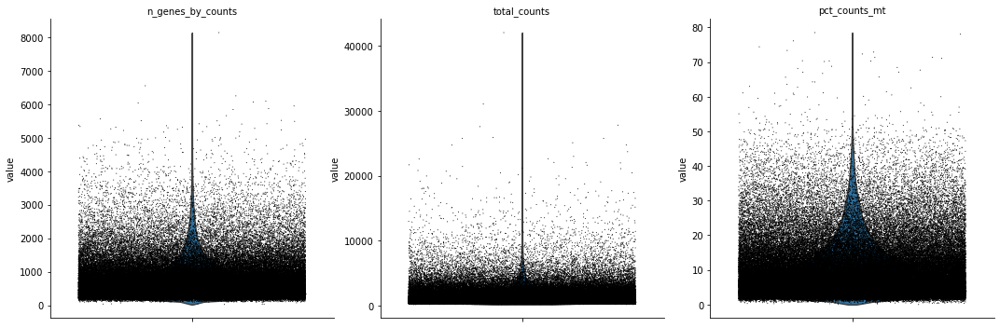

In [19]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

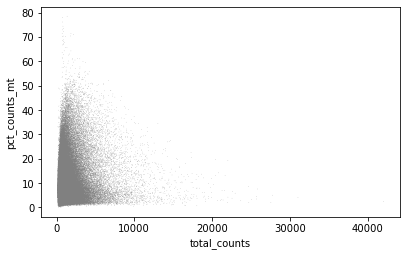

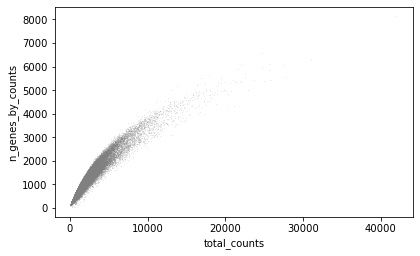

In [20]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [21]:
genes = cudf.Series(adata.var_names).str.upper()
print(genes)
from scipy import sparse

sparse_X = sparse.csr_matrix(adata.X)
adata.X = sparse_X
sparse_gpu_array = cp.sparse.csr_matrix(adata.X)

0        0610005C13RIK
1        0610007P14RIK
2        0610009B22RIK
3        0610009E02RIK
4        0610009L18RIK
             ...      
27380          N-R5S93
27381          N-R5S94
27382          N-R5S95
27383          N-R5S96
27384          N-R5S98
Length: 27385, dtype: object


In [22]:
import pandas as pd
df=genes.to_pandas()
for marker in markers:
    if not marker in df.values:
        print("%s is not included"%marker)
        markers.remove(marker)
        print("%s is removed from marker list"%marker)

Verify the shape of the resulting sparse matrix:

In [23]:
sparse_gpu_array.shape

(127375, 27385)

And the number of non-zero values in the matrix:

In [24]:
sparse_gpu_array.nnz

96610803

In [25]:
%%time
sparse_gpu_array = rapids_scanpy_funcs.filter_cells(sparse_gpu_array, min_genes=min_genes_per_cell, max_genes=max_genes_per_cell)

CPU times: user 478 ms, sys: 315 ms, total: 794 ms
Wall time: 798 ms


Some genes will now have zero expression in all cells. We filter out such genes.

In [26]:
%%time
sparse_gpu_array, genes = rapids_scanpy_funcs.filter_genes(sparse_gpu_array, genes, min_cells=min_cells_per_gene)

CPU times: user 765 ms, sys: 83 ms, total: 848 ms
Wall time: 850 ms


The size of our count matrix is now reduced.

In [27]:
sparse_gpu_array.shape

(124334, 27375)

In [53]:
len(genes)

22414

In [28]:
%%time
tmp_norm = sparse_gpu_array.tocsc()
marker_genes_raw = {
    ("%s_raw" % marker): tmp_norm[:, genes[genes == marker].index[0]].todense().ravel()
    for marker in markers
}

del tmp_norm

CPU times: user 367 ms, sys: 77.2 ms, total: 444 ms
Wall time: 440 ms


### Regress out confounding factors (number of counts, mitochondrial gene expression)

We can now perform regression on the count matrix to correct for confounding factors -  for example purposes, we use the number of counts and the expression of mitochondrial genes (named starting with `mt-`).

We now calculate the total counts and the percentage of mitochondrial counts for each cell.

In [29]:
%%time
mito_genes = genes.str.startswith(MITO_GENE_PREFIX)

n_counts = sparse_gpu_array.sum(axis=1)
percent_mito = (sparse_gpu_array[:,mito_genes].sum(axis=1) / n_counts).ravel()

n_counts = cp.array(n_counts).ravel()
percent_mito = cp.array(percent_mito).ravel()

CPU times: user 19.3 ms, sys: 2.09 ms, total: 21.4 ms
Wall time: 26.4 ms


And perform regression:

In [30]:
%%time
sparse_gpu_array = rapids_scanpy_funcs.regress_out(sparse_gpu_array.tocsc(), n_counts, percent_mito)
del n_counts, percent_mito, mito_genes

### Scale

Finally, we scale the count matrix to obtain a z-score and apply a cutoff value of 10 standard deviations, obtaining the preprocessed count matrix.

In [ ]:
%%time
mean = sparse_gpu_array.mean(axis=0)
sparse_gpu_array -= mean
stddev = cp.sqrt(sparse_gpu_array.var(axis=0))
sparse_gpu_array /= stddev
sparse_gpu_array = sparse_gpu_array.clip(a_max=10)
del mean, stddev

In [40]:
preprocess_time = time.time()
print("Total Preprocessing time: %s" % (preprocess_time-preprocess_start))

Total Preprocessing time: 6320.230562925339


## Cluster & Visualize

We store the preprocessed count matrix as an AnnData object, which is currently in host memory. We also add the expression levels of the marker genes as observations to the annData object.

In [ ]:
%%time
adata = anndata.AnnData(sparse_gpu_array.get())
adata.var_names = genes.to_pandas()
del sparse_gpu_array, genes

CPU times: user 2.59 s, sys: 1.9 s, total: 4.49 s
Wall time: 4.56 s


In [42]:
print(marker_genes_raw)

{'CX3CR1_raw': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'CLDN5_raw': array([0., 0., 0., ..., 1., 0., 0.], dtype=float32), 'GLUL_raw': array([2., 1., 1., ..., 0., 0., 0.], dtype=float32), 'NDRG2_raw': array([0., 4., 6., ..., 0., 0., 0.], dtype=float32), 'PCDH15_raw': array([1., 0., 0., ..., 0., 0., 0.], dtype=float32), 'PLP1_raw': array([3., 5., 4., ..., 1., 0., 0.], dtype=float32), 'MBP_raw': array([6., 3., 5., ..., 0., 0., 0.], dtype=float32), 'SATB2_raw': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'SLC17A7_raw': array([3., 1., 0., ..., 0., 0., 0.], dtype=float32), 'SLC17A6_raw': array([23., 23., 22., ...,  0.,  0.,  0.], dtype=float32), 'GAD2_raw': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'GAD1_raw': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'SNAP25_raw': array([ 81.,  82., 110., ...,   0.,   0.,   2.], dtype=float32), 'HTR1A_raw': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'HTR1B_raw': array([0., 0., 0., ..., 0., 0., 0.], dtype=

In [ ]:
%%time
GPCR_df=pd.DataFrame()
for name, data in marker_genes_raw.items():
    adata.obs[name] = data.get()
    if   name[:-4] in GPCR_list:
        GPCR_df[name]=data.get()

CPU times: user 74.5 ms, sys: 4.17 ms, total: 78.7 ms
Wall time: 178 ms


## Calculate response to antipsychotics in each cells

In [ ]:
GPCR_adata=anndata.AnnData(X=GPCR_df)
#print(GPCR_adata.X.shape)
GPCR_adata.obs=pd.DataFrame(GPCR_df.index)
GPCR_adata.var=pd.DataFrame(GPCR_df.columns)

In [ ]:
GPCR_adata_norm=sc.pp.normalize_total(GPCR_adata,target_sum=1e4,inplace=False)['X']

In [ ]:
norm_df=pd.DataFrame(GPCR_adata_norm)
norm_col=[str[:-4] for str in GPCR_df.columns]
#print(norm_col)
norm_df.columns=norm_col
print(norm_df)

        HTR1A  HTR1B  HTR1D  HTR2A  HTR2B    HTR2C  HTR3A  HTR4       HTR5A  \
0         0.0    0.0    0.0    0.0    0.0      0.0    0.0   0.0  714.285767   
1         0.0    0.0    0.0    0.0    0.0      0.0    0.0   0.0    0.000000   
2         0.0    0.0    0.0    0.0    0.0      0.0    0.0   0.0    0.000000   
3         0.0    0.0    0.0    0.0    0.0  10000.0    0.0   0.0    0.000000   
4         0.0    0.0    0.0    0.0    0.0      0.0    0.0   0.0    0.000000   
...       ...    ...    ...    ...    ...      ...    ...   ...         ...   
124329    0.0    0.0    0.0    0.0    0.0      0.0    0.0   0.0    0.000000   
124330    0.0    0.0    0.0    0.0    0.0      0.0    0.0   0.0    0.000000   
124331    0.0    0.0    0.0    0.0    0.0      0.0    0.0   0.0    0.000000   
124332    0.0    0.0    0.0    0.0    0.0      0.0    0.0   0.0    0.000000   
124333    0.0    0.0    0.0    0.0    0.0      0.0    0.0   0.0    0.000000   

        HTR6  ...       CHRM3  CHRM4  CHRM5  ADRA1A

In [ ]:
print(GPCR_type_df[GPCR_type_df.receptor_name.isin(norm_col)])
GPCR_type_df=GPCR_type_df[GPCR_type_df.receptor_name.isin(norm_col)]

   receptor_name type
0         ADRA1A   Gq
1         ADRA1B   Gq
2         ADRA2A   Gi
3         ADRA2B   Gi
4         ADRA2C   Gi
5          ADRB1   Gs
6          ADRB2   Gs
7          CHRM1   Gq
8          CHRM2   Gi
9          CHRM3   Gq
10         CHRM4   Gi
11         CHRM5   Gq
12          DRD1   Gs
13          DRD2   Gi
14          DRD3   Gi
15          DRD4   Gi
16          DRD5   Gs
17          HRH1   Gq
18          HRH2   Gs
19          HRH3   Gi
20         HTR1A   Gi
21         HTR1B   Gi
22         HTR1D   Gi
24         HTR2A   Gq
25         HTR2B   Gq
26         HTR2C   Gq
27          HTR4   Gs
28          HTR6   Gs
29          HTR7   Gs


In [ ]:
Gs=GPCR_type_df[GPCR_type_df.type=="Gs"]["receptor_name"].values
Gi=GPCR_type_df[GPCR_type_df.type=="Gi"]["receptor_name"].values
Gq=GPCR_type_df[GPCR_type_df.type=="Gq"]["receptor_name"].values

#print(Gs)
#print(GPCR_adata_norm)
drug_list=D_R_mtx.index.to_list()
#print(drug_list)
#drug_receptor_mtx
cAMP_df=pd.DataFrame(columns=drug_list)
Ca_df=pd.DataFrame(columns=drug_list)
for drug in drug_list:
    Gs_effect=(norm_df.loc[:,Gs]/D_R_mtx.loc[drug,Gs]).sum(axis=1) #TODO ki値で割り算するときにlog換算すべきか
    Gi_effect=(norm_df.loc[:,Gi]/D_R_mtx.loc[drug,Gi]).sum(axis=1)
    Gq_effect=(norm_df.loc[:,Gq]/D_R_mtx.loc[drug,Gq]).sum(axis=1)
    cAMPmod=Gi_effect-Gs_effect #Giの阻害→cAMP上昇、Gsの阻害→cAMP低下
    Camod=-Gq_effect #Gq阻害→Ca低下
    cAMP_df[drug]=cAMPmod
    Ca_df[drug]=Camod

In [ ]:
file_path="/temp/data/mouse_thalamus/WT_thalamus_GPCR_adata.h5ad"
GPCR_adata.write(file_path)

TypeError: 0 of type <class 'int'> is an invalid key. Should be str.

Above error raised while writing key 'obs' of <class 'h5py._hl.files.File'> from /.

In [8]:
file_path="/temp/data/mouse_thalamus/WT_thalamus_adata.h5ad"
#adata.write(file_path)
adata = anndata.read_h5ad(file_path)

In [9]:
print(cAMP_df)
print(Ca_df)
import seaborn as sns
from matplotlib.colors import LogNorm
#sns.heatmap(cAMP_df,norm=LogNorm())
sns.heatmap(Ca_df)

NameError: name 'cAMP_df' is not defined

### Reduce

We use PCA to reduce the dimensionality of the matrix to its top 50 principal components.

If the number of cells was smaller, we would use the command `adata.obsm["X_pca"] = cuml.decomposition.PCA(n_components=n_components, output_type="numpy").fit_transform(adata.X)` to perform PCA on all the cells.

However, we cannot perform PCA on the complete dataset using a single GPU. Therefore, we use the batched PCA function in `utils.py`, which uses only a fraction of the total cells to train PCA.

In [10]:
%%time
adata = utils.pca(adata, n_components=n_components, 
                  train_ratio=pca_train_ratio, 
                  n_batches=n_pca_batches,
                  gpu=True)

CPU times: user 46.3 s, sys: 23 s, total: 1min 9s
Wall time: 1min 17s


In [14]:
cAMP_df.index=adata.obs_names
Ca_df.index=adata.obs_names
Ca_df=Ca_df+10**(-4)
for drug in drug_list:
    adata.obs['cAMP_%s'%drug]=cAMP_df[drug]
    adata.obs['Ca_%s'%drug]=Ca_df[drug]

NameError: name 'cAMP_df' is not defined

In [16]:
adata.var

""
0610005C13Rik
0610007P14Rik
0610009B22Rik
0610009E02Rik
0610009L18Rik
...
n-R5s93
n-R5s94
n-R5s95
n-R5s96


In [111]:
print(adata.X.shape)
print(adata.obs_keys)


(5771, 19196)
<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 5771 × 19196
    obs: 'CX3CR1_raw', 'CLDN5_raw', 'GLUL_raw', 'NDRG2_raw', 'PCDH15_raw', 'PLP1_raw', 'MBP_raw', 'SATB2_raw', 'SLC17A7_raw', 'SLC17A6_raw', 'GAD2_raw', 'GAD1_raw', 'SNAP25_raw', 'HTR1A_raw', 'HTR1B_raw', 'HTR1D_raw', 'HTR2A_raw', 'HTR2C_raw', 'HTR3A_raw', 'HTR4_raw', 'HTR5A_raw', 'HTR6_raw', 'HTR7_raw', 'DRD1_raw', 'DRD2_raw', 'DRD4_raw', 'DRD5_raw', 'HRH1_raw', 'HRH2_raw', 'HRH3_raw', 'CHRM1_raw', 'CHRM2_raw', 'CHRM3_raw', 'ADRA1A_raw', 'ADRA1B_raw', 'ADRA2A_raw', 'ADRA2C_raw', 'ADRB1_raw', 'ADRB2_raw'
    obsm: 'X_pca'>


### t-SNE + K-means

We cluster the cells using k-means on the principal components. For example purposes, we set k=35.

In [11]:
%%time
adata.obsm['X_tsne'] = TSNE().fit_transform(adata.obsm["X_pca"][:,:tsne_n_pcs])

[W] [12:31:40.791276] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
CPU times: user 1.47 s, sys: 1.29 s, total: 2.77 s
Wall time: 2.8 s


In [12]:
%%time
kmeans = KMeans(n_clusters=k, init="k-means++", random_state=0).fit(adata.obsm['X_pca'])
adata.obs['kmeans'] = kmeans.labels_.astype(str)

CPU times: user 823 ms, sys: 38.7 ms, total: 862 ms
Wall time: 886 ms


We visualize the cells using t-SNE and label cells by color according to the k-means clustering.

... storing 'kmeans' as categorical


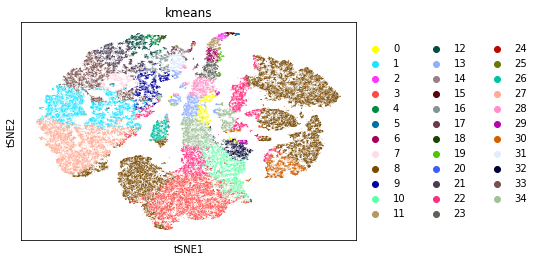

CPU times: user 1.01 s, sys: 119 ms, total: 1.13 s
Wall time: 1.17 s


In [13]:
%%time
sc.pl.tsne(adata, color=["kmeans"])

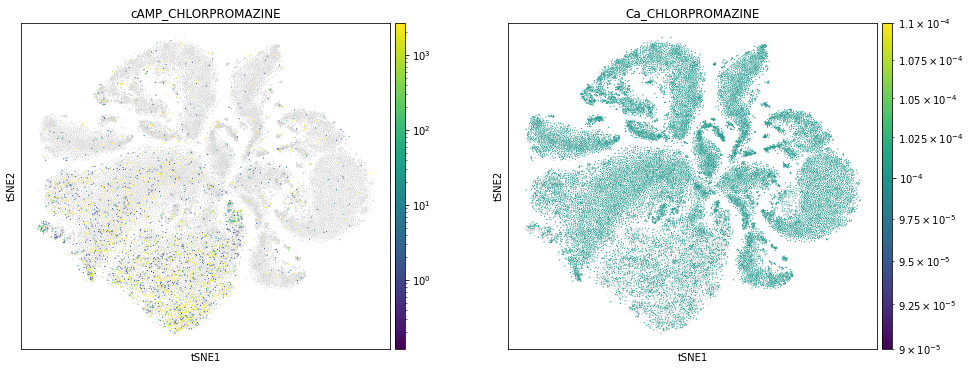

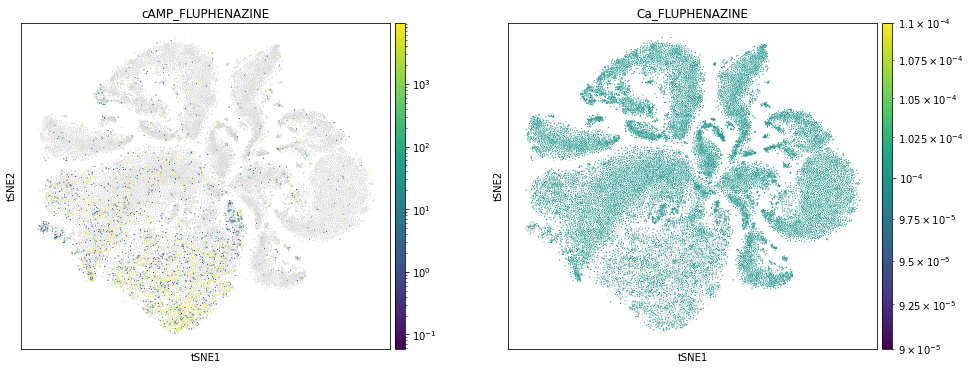

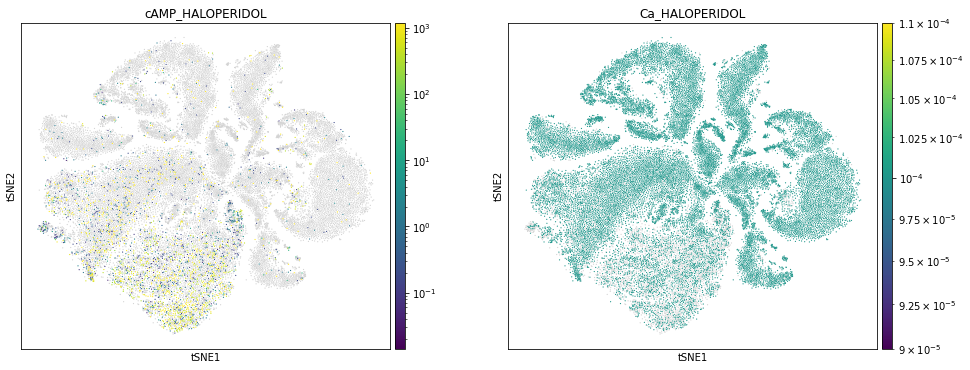

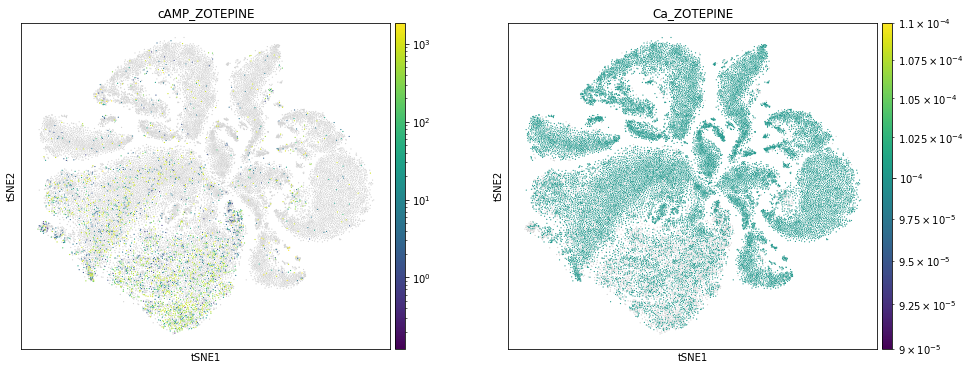

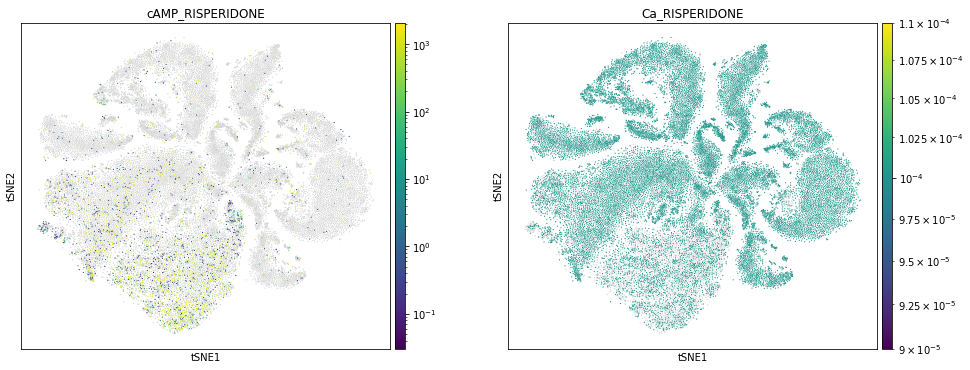

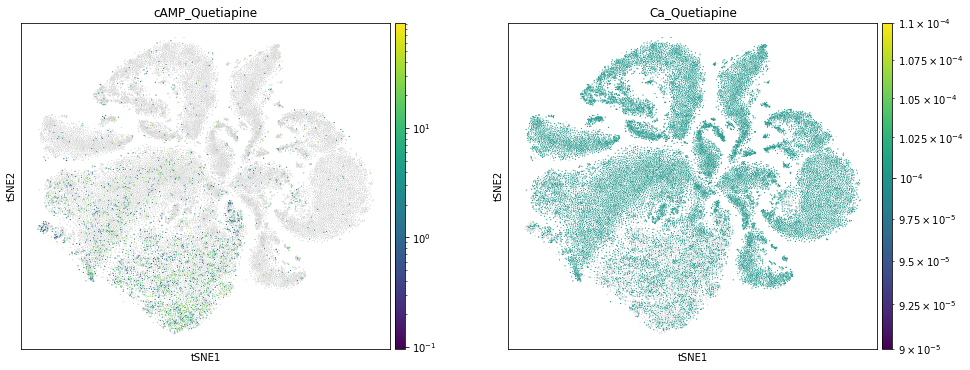

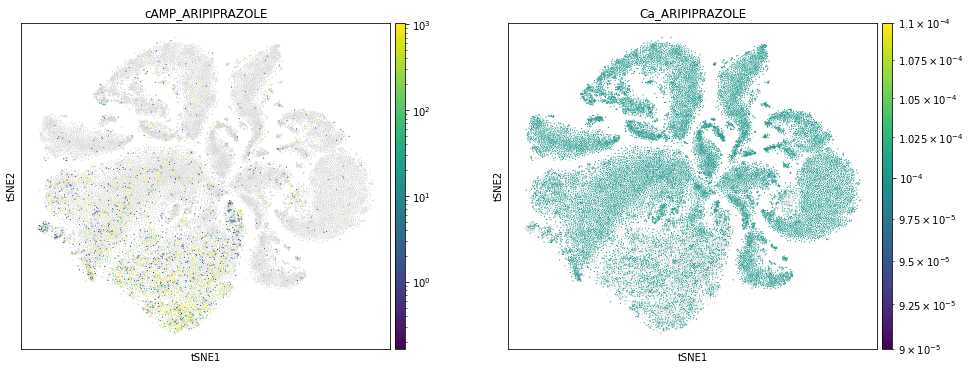

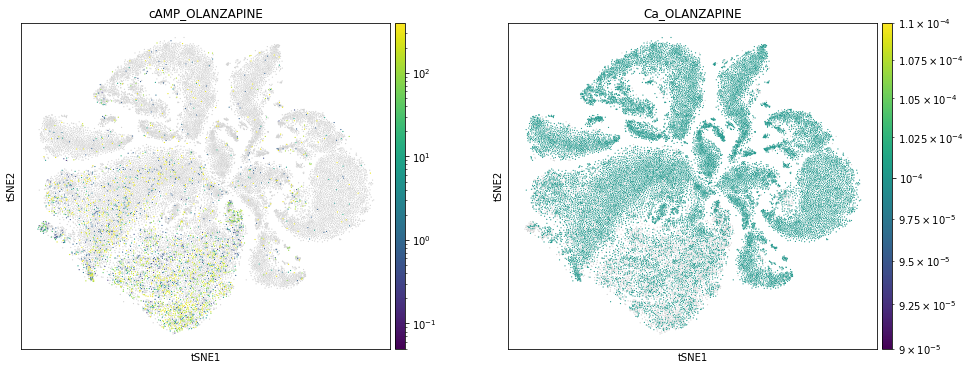

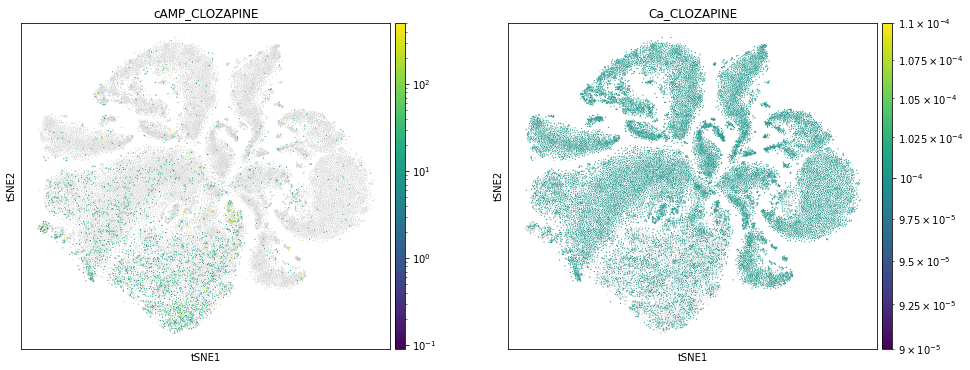

In [71]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
for drug in drug_list:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,6), gridspec_kw={'wspace':0.2})
    ax1_dict = sc.pl.tsne(adata, color=["cAMP_%s"%drug],norm=LogNorm(),ax=ax1, show=False)
    ax2_dict = sc.pl.tsne(adata, color=["Ca_%s"%drug],norm=LogNorm(),ax=ax2, show=False)

We label the cells using the `Etv1` and `Nos1` marker genes for excitatory neurons. For inhibitory neurons, we use 'Gad1' and 'Glp1r' as marker. These visualizations show us the separation of excitatory and inhibiotry on the t-SNE plot.

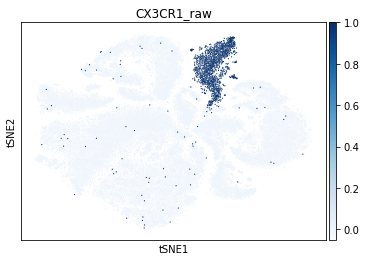

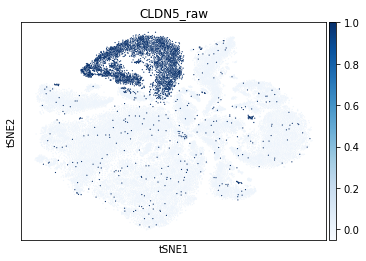

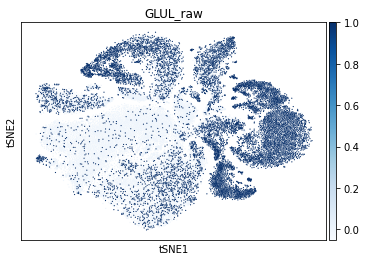

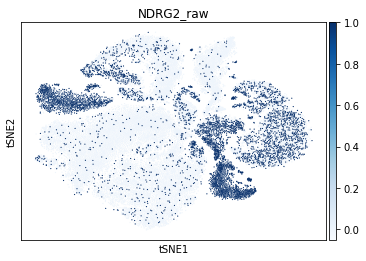

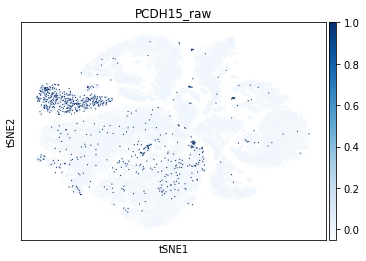

...

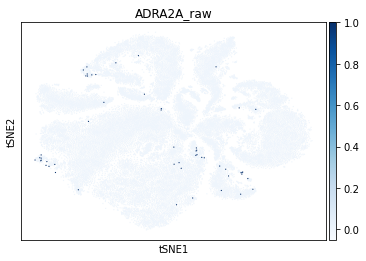

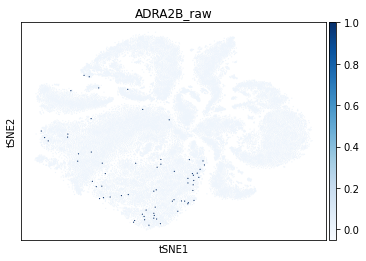

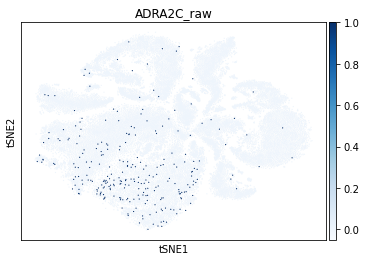

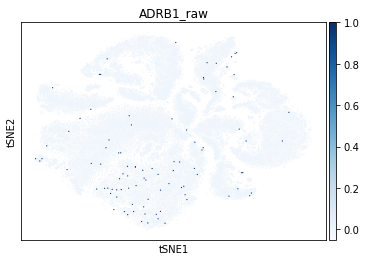

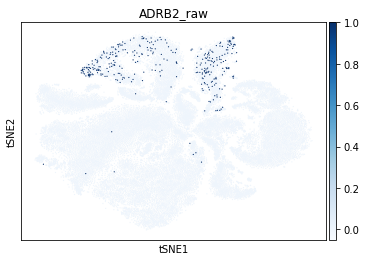

CPU times: user 6.6 s, sys: 58 ms, total: 6.66 s
Wall time: 6.61 s


In [72]:
%%time
for marker in markers:
    sc.pl.tsne(adata, color=["%s_raw"%marker], color_map="Blues", vmax=1, vmin=-0.05)

In [ ]:
print(adata.obs["cAMP"])

### UMAP + Graph clustering

We can also visualize the cells using the UMAP algorithm in Rapids. Before UMAP, we need to construct a k-nearest neighbors graph in which each cell is connected to its nearest neighbors. This can be done conveniently using rapids functionality already integrated into Scanpy.

Note that Scanpy uses an approximation to the nearest neighbors on the CPU while the GPU version performs an exact search. While both methods are known to yield useful results, some differences in the resulting visualization and clusters can be observed.

In [73]:
%%time
sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=knn_n_pcs, method='rapids')

CPU times: user 392 ms, sys: 164 ms, total: 556 ms
Wall time: 548 ms


The UMAP function from Rapids is also integrated into Scanpy.

In [74]:
%%time
sc.tl.umap(adata, min_dist=umap_min_dist, spread=umap_spread, method='rapids')

CPU times: user 97.1 ms, sys: 114 ms, total: 211 ms
Wall time: 209 ms


Next, we use the Louvain algorithm for graph-based clustering.

In [75]:
%%time
sc.tl.louvain(adata, flavor='rapids')

CPU times: user 61.3 ms, sys: 12.4 ms, total: 73.7 ms
Wall time: 71.4 ms


We plot the cells using the UMAP visualization, and using the Louvain clusters as labels.

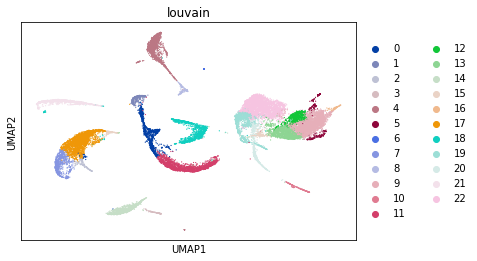

CPU times: user 428 ms, sys: 16.1 ms, total: 445 ms
Wall time: 441 ms


In [76]:
%%time
sc.pl.umap(adata, color=["louvain"])

We can also use the Leiden clustering method in RAPIDS. This method has not been integrated into Scanpy and needs to be called separately.

In [77]:
%%time
adata.obs['leiden'] = rapids_scanpy_funcs.leiden(adata)

CPU times: user 58.4 ms, sys: 747 µs, total: 59.2 ms
Wall time: 57.1 ms


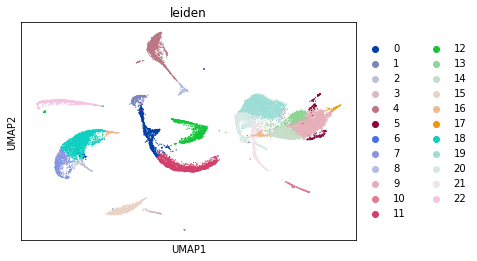

CPU times: user 441 ms, sys: 368 µs, total: 442 ms
Wall time: 439 ms


In [78]:
%%time
sc.pl.umap(adata, color=["leiden"])

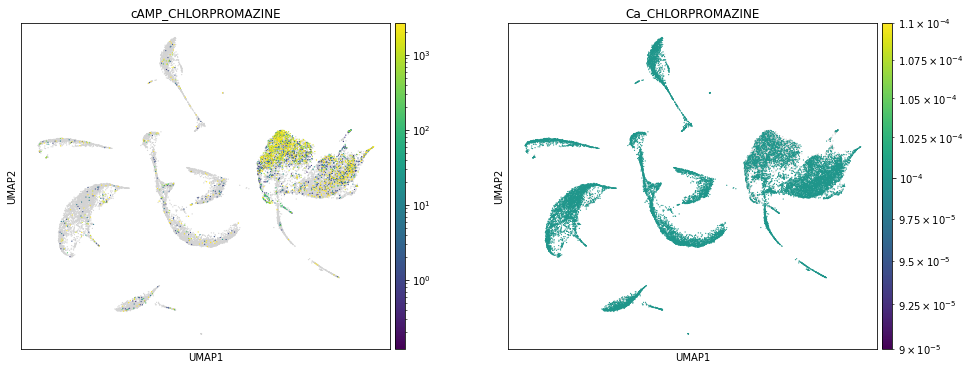

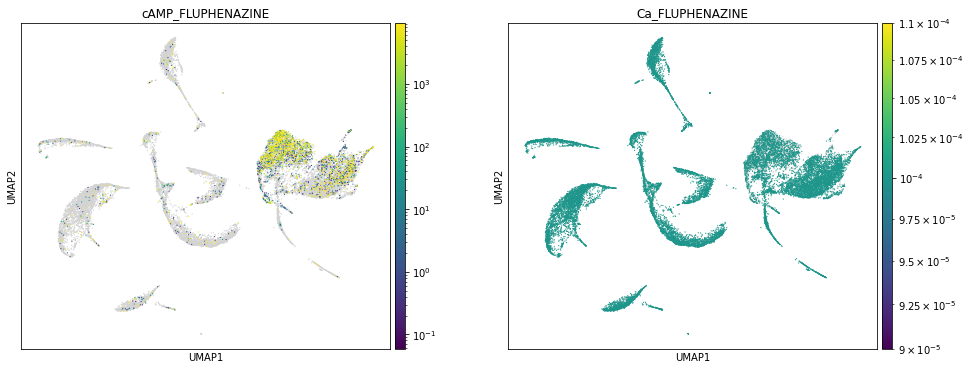

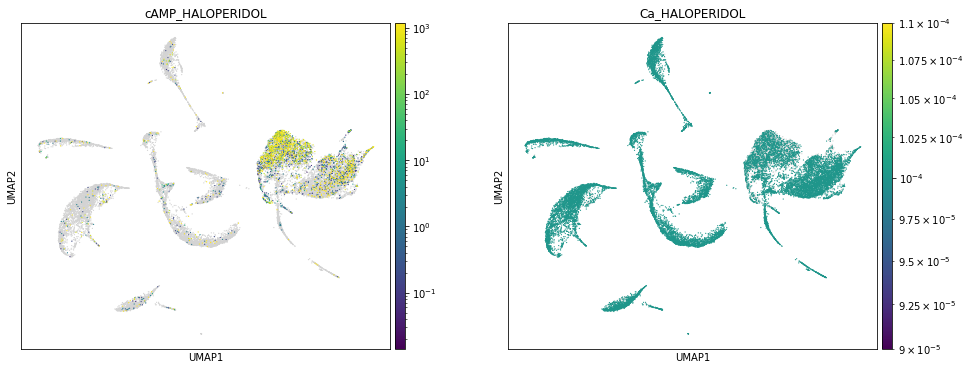

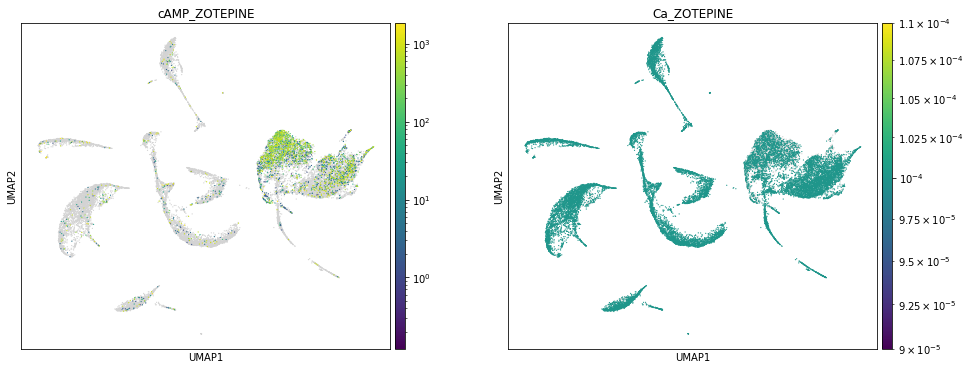

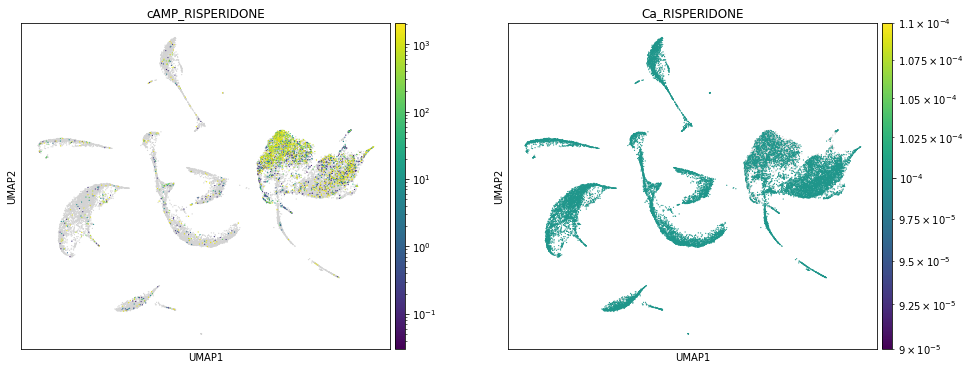

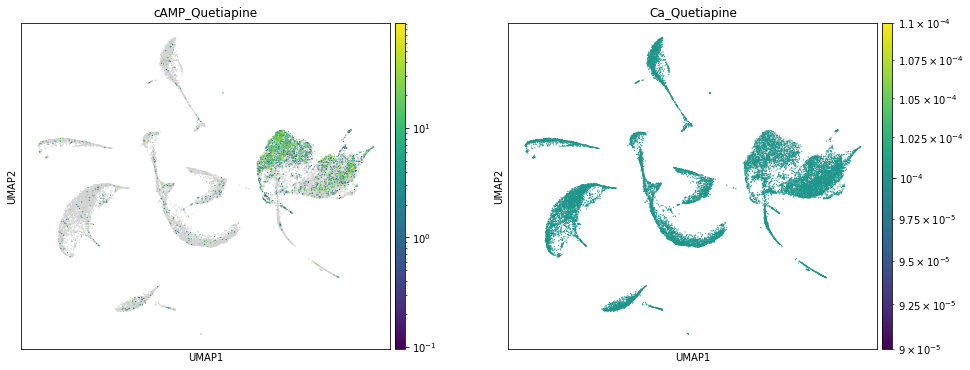

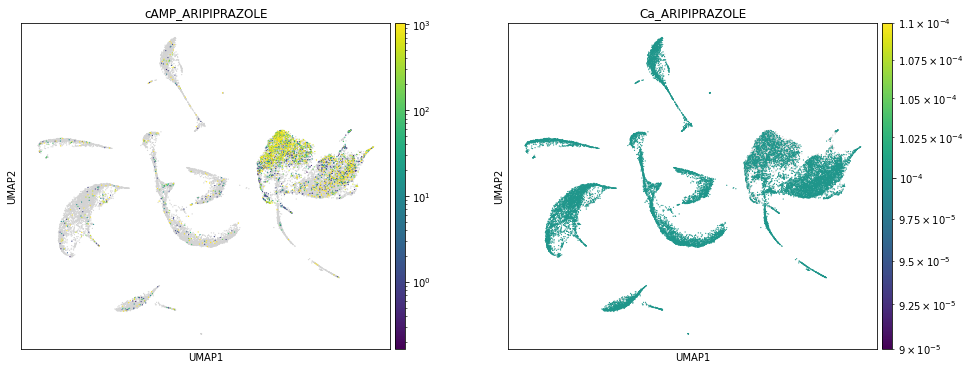

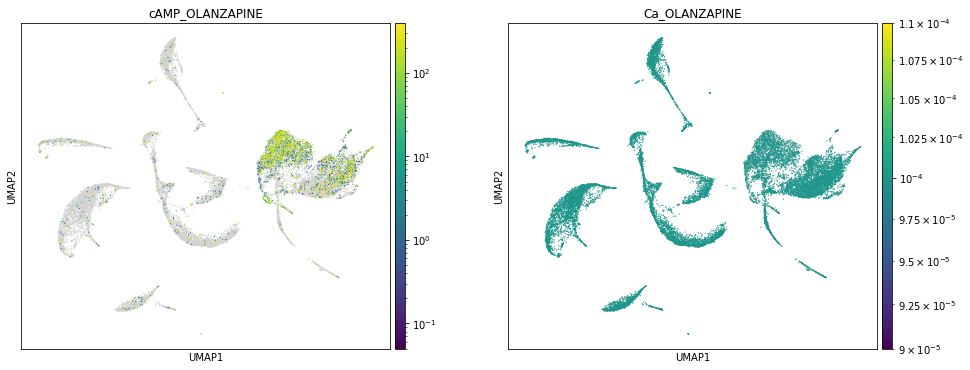

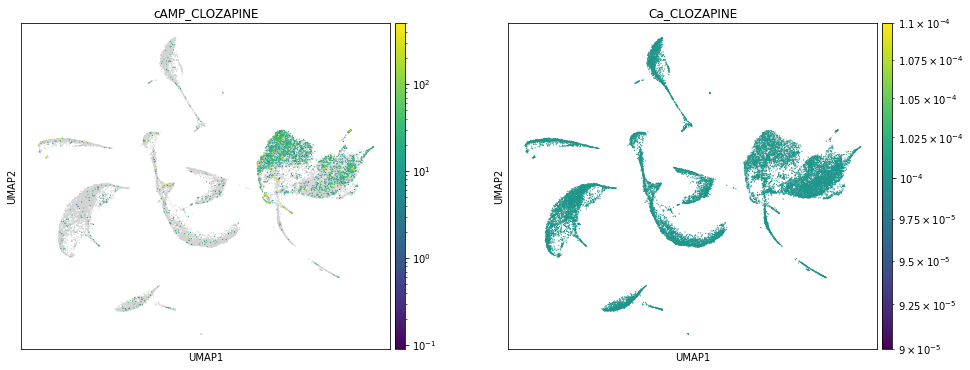

In [79]:
for drug in drug_list:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,6), gridspec_kw={'wspace':0.2})
    ax1_dict = sc.pl.umap(adata, color=["cAMP_%s"%drug],norm=LogNorm(),ax=ax1, show=False)
    ax2_dict = sc.pl.umap(adata, color=["Ca_%s"%drug],norm=LogNorm(),ax=ax2, show=False)

And we can visualize the cells labeled by expression of the `Stmn2` and `Hes1` marker genes, for neuronal and glial cells respectively.

In [1]:
%%time
#sc.pl.umap(adata, color=["Etv1_raw"], color_map="Reds", vmax=1, vmin=-0.05)
#sc.pl.umap(adata, color=["Nos1_raw"], color_map="Reds", vmax=1, vmin=-0.05)
#sc.pl.umap(adata, color=["Gad1_raw"], color_map="Blues", vmax=1, vmin=-0.05)
#sc.pl.umap(adata, color=["Glp1r_raw"], color_map="Blues", vmax=1, vmin=-0.05)
for marker in markers:
    sc.pl.umap(adata, color=["%s_raw"%marker], color_map="Blues", vmax=1, vmin=-0.05)

NameError: name 'markers' is not defined

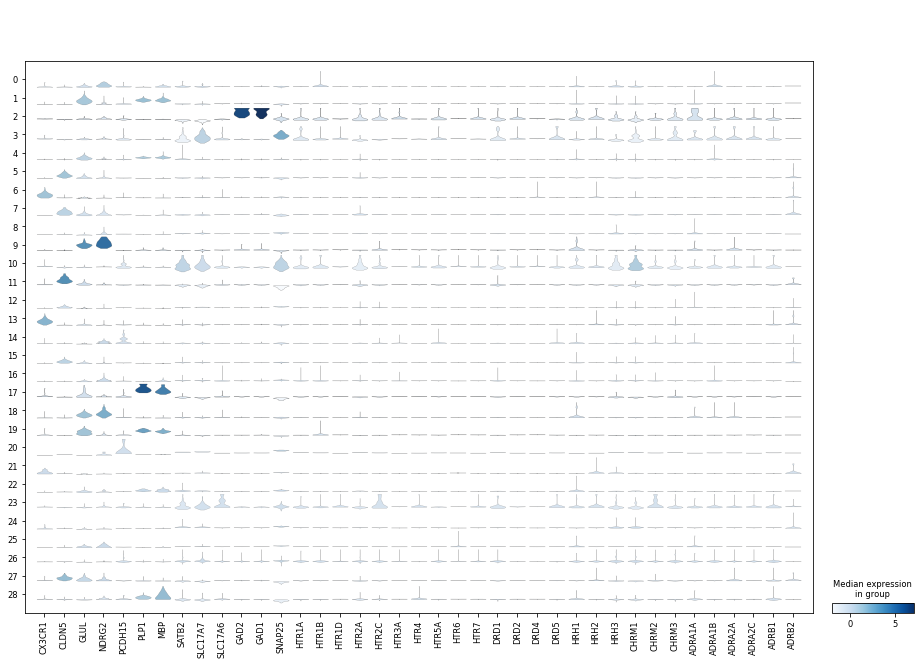

In [123]:
sc.pl.stacked_violin(adata, markers, groupby='leiden', rotation=90)

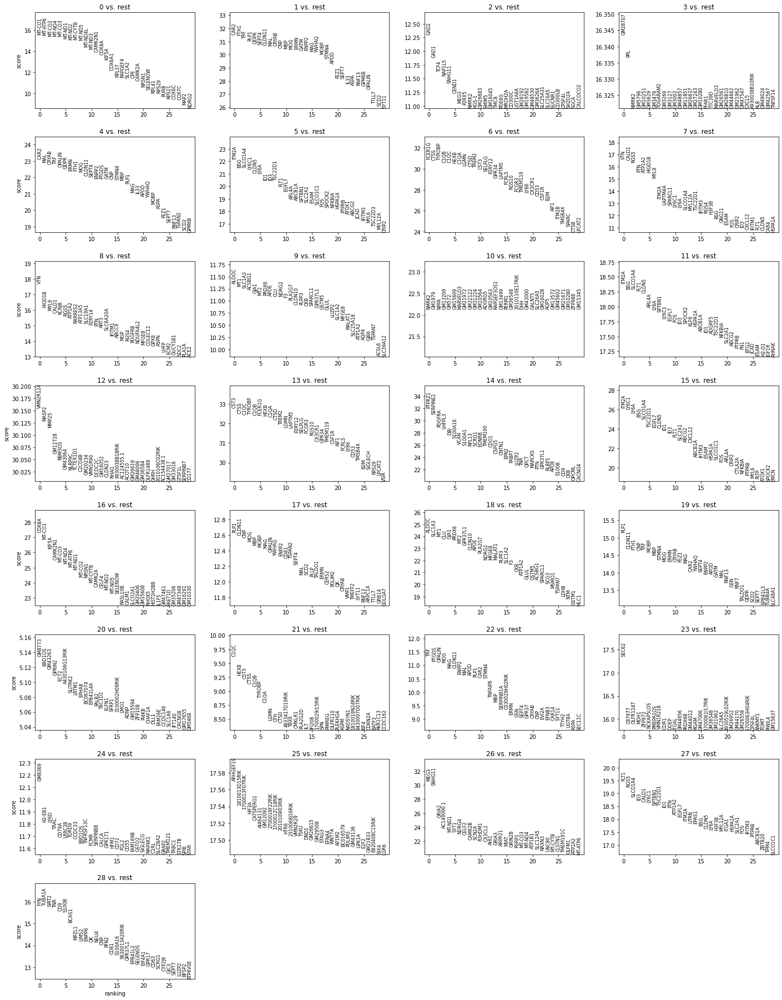

In [124]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=30, sharey=False)

In [145]:
%%time
nos1_cells = marker_genes_raw["NOS1_raw"] > 0.0
adata.obs["celltype"] = nos1_cells.get()
print(adata.obs["celltype"])

0       False
1       False
2       False
3        True
4       False
        ...  
7740    False
7741    False
7742    False
7743    False
7744    False
Name: celltype, Length: 7745, dtype: bool
CPU times: user 6.73 ms, sys: 17.6 ms, total: 24.3 ms
Wall time: 22 ms


In [143]:
#sc.pl.umap(adata, color=["DRD2"],color_map="Blues", vmax=1, vmin=-0.05)
print(adata.obs_keys)
print(adata.obs["louvain"])

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 7745 × 22414
    obs: 'NOS1_raw', 'ETV1_raw', 'SLC1A1_raw', 'SLC17A7_raw', 'GAD1_raw', 'SLC32A1_raw', 'GLP1R_raw', 'HTR1A_raw', 'HTR1B_raw', 'HTR1D_raw', 'HTR2A_raw', 'HTR2B_raw', 'HTR2C_raw', 'HTR3A_raw', 'HTR4_raw', 'HTR5A_raw', 'HTR6_raw', 'HTR7_raw', 'DRD1_raw', 'DRD2_raw', 'DRD3_raw', 'DRD5_raw', 'HRH1_raw', 'HRH2_raw', 'HRH3_raw', 'CHRM1_raw', 'CHRM2_raw', 'CHRM3_raw', 'ADRA1A_raw', 'ADRA1B_raw', 'ADRA2A_raw', 'ADRA2B_raw', 'ADRA2C_raw', 'ADRB1_raw', 'ADRB2_raw', 'kmeans', 'louvain', 'leiden'
    uns: 'kmeans_colors', 'neighbors', 'umap', 'louvain', 'louvain_colors', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    obsp: 'distances', 'connectivities'>
0        0
1        0
2        8
3        7
4        0
        ..
7740    10
7741    10
7742     8
7743     9
7744     8
Name: louvain, Length: 7745, dtype: category
Categories (11, object): ['0', '1', '2', '3', ..., '7', '8', '9', '

In [ ]:
h5_fname=os.path.join(dir,"mouse_WT_NAc_adata.h5ad")
adata.write(filename=h5_fname)

## Create Zoomed View

The speedup offered by Rapids makes it easy to interactively re-analyze subsets of cells. To illustrate this, we select excitatory cells (Nos1+) from the dataset.

In [125]:
reanalysis_start = time.time()

In [127]:
%%time
nos1_cells = marker_genes_raw["Nos1_raw"] > 0.0
adata = adata[nos1_cells.get(),:]
print(adata.shape)

(1346, 22414)
CPU times: user 12.2 ms, sys: 47 µs, total: 12.3 ms
Wall time: 10.5 ms


We can repeat the dimension reduction, clustering and visualization using this subset of cells in seconds. Here, we can perform PCA for all of the selected cells on a single GPU.

In [128]:
%%time
adata.obsm["X_pca"] = PCA(n_components=n_components, output_type="numpy").fit_transform(adata.X)
sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=knn_n_pcs, method='rapids')
sc.tl.umap(adata, min_dist=umap_min_dist, spread=umap_spread, method='rapids')
adata.obs['leiden'] = rapids_scanpy_funcs.leiden(adata)

CPU times: user 8.73 s, sys: 10 s, total: 18.8 s
Wall time: 17.2 s


Finally, we visualize the selected neuronal cells labeled by their new clusters, and by the expression of `Olig1`, a marker gene for oligodendrocytes.

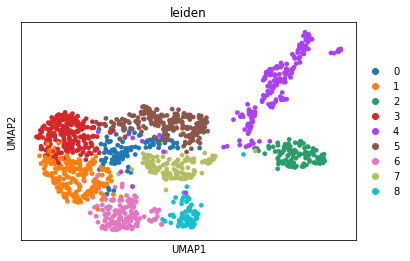

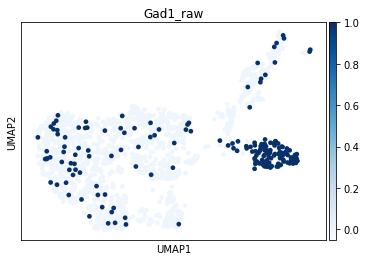

CPU times: user 263 ms, sys: 8.8 ms, total: 272 ms
Wall time: 266 ms


In [129]:
%%time
sc.pl.umap(adata, color=["leiden"])
sc.pl.umap(adata, color=["Gad1_raw"], color_map="Blues", vmax=1, vmin=-0.05)

In [130]:
reanalysis_time = time.time()
print("Total reanalysis time : %s" % (reanalysis_time-reanalysis_start))

Total reanalysis time : 129.17132544517517


In [131]:
print("Full time: %s" % (time.time() - start))

Full time: 2361.712217092514
